# RPM (CellTagged Pre- and Post-Cre) and RPMA (CellTagged Pre-Cre) TBO-derived alllograft tumours
### Ireland et al., 2025

Modified from [Fig3-4_ExtFig5-6_RPM_RPMA_Allografts_CellTag_CellRank_Final_Clean.ipynb on GitHub](https://github.com/TGOliver-lab/Ireland_Basal_SCLC_2025/blob/main/Python_Code/Fig3-4_ExtFig5-6_RPM_RPMA_Allografts_CellTag_CellRank_Final_Clean.ipynb)  

Related to 
* Fig. 2e,f,h 
* Fig 5h
* Extended Data Fig 5e,f
* Extended Data 6d

In [1]:
#Import relevant packages
import numpy as np
import pandas as pd
from matplotlib import rcParams
import os
import scanpy as sc

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.cm as cm # color maps
from matplotlib.pyplot import rc_context
from matplotlib.colors import LinearSegmentedColormap

#For nice color schemes
import cmocean

#For barplots
import seaborn as sns

In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, dpi_save=300, facecolor='white')

### Load data

In [3]:
adata2 = sc.read_h5ad("../data/050125_RPM_RPMA_TBOAllo_CellTagAnalysis_New_1.2_fate_FAprojection_DPT_final.h5ad") # 042725_RPM_RPMA_TBOAllo_CellTagAnalysis_New_1.2.h5ad work for early figs

adata2

AnnData object with n_obs × n_vars = 26618 × 55491
    obs: 'Genotype', 'GenoCT', 'Model', 'Cre', 'UnID', 'Batch', 'batch', 'n_genes_by_counts', 'total_counts', 'total_counts_mito', 'pct_counts_mito', 'n_genes', 'log1p_total_counts', 'leiden_scVI_1.1', 'cluster', 'leiden_scVI_1.2', 'dpt_pseudotime', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'clusters_gradients', 'cell_type'
    var: 'gene_ids', 'feature_types', 'mito', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean_', 'frac_zero'
    uns: 'GenoCT_colors', 'Genotype_colors', 'UnID_colors', 'cell_type_colors', 'clusters_gradients_colors', 'coarse_fwd', 'dendrogram_leiden_scVI_1.2', 'diffmap_evals', 'draw_graph', 'eigendecomposition_fwd', 'hvg', 'iroot', 'leiden', 'leiden_scVI_1.1_colors', 'leiden_scVI_1.2_colors', 'macrostates_fwd_colors', 'neighbors', 'schur_matrix_fwd', 'term_states_fwd_colors', 'u

In [4]:
adata2.obs['Genotype'].value_counts()

Genotype
RPM     16458
RPMA    10160
Name: count, dtype: int64

### Plot data in UMAP

In [5]:
adata2.uns['Genotype_colors'] = ["#400080", # dark purple
                                 "#FF7F00", # orange
                                 ]

### **Fig 2e**

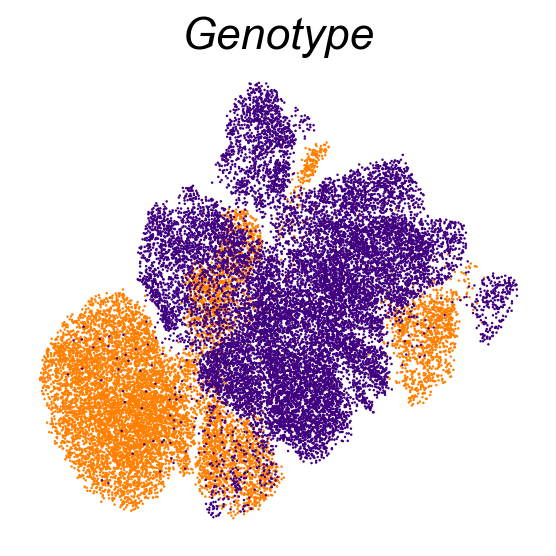

In [6]:
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=['Genotype'],
    use_raw=False,
    legend_loc="none",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=5,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=20, fontstyle='italic')

plt.tight_layout()
plt.show()

### **Fig 2f**

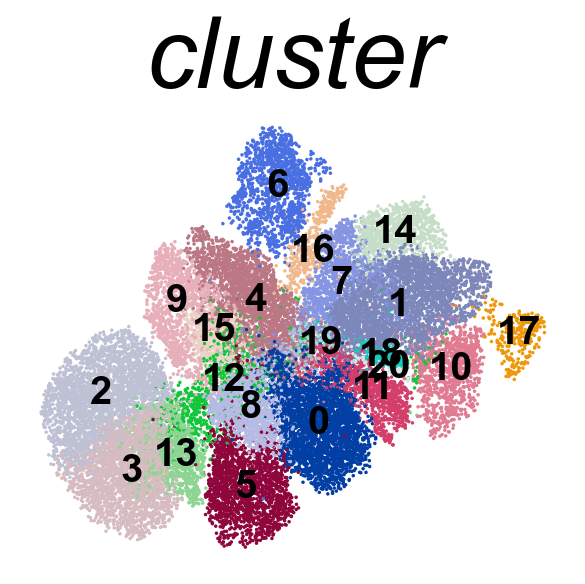

In [7]:
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=18)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=['cluster'],
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=10,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

### Extended Data Fig 5f

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/1706310340.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


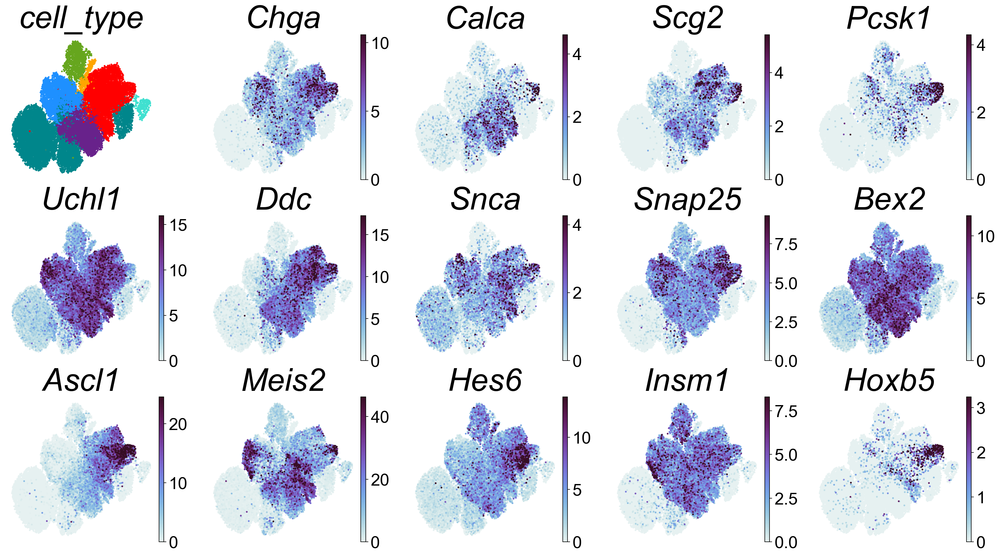

In [8]:
genes = ['cell_type', 'Chga', 'Calca', 'Scg2', 'Pcsk1', 'Uchl1', 'Ddc',
         'Snca', 'Snap25', 'Bex2', 'Ascl1', 'Meis2', 'Hes6', 'Insm1', 'Hoxb5']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="none",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/17377971.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


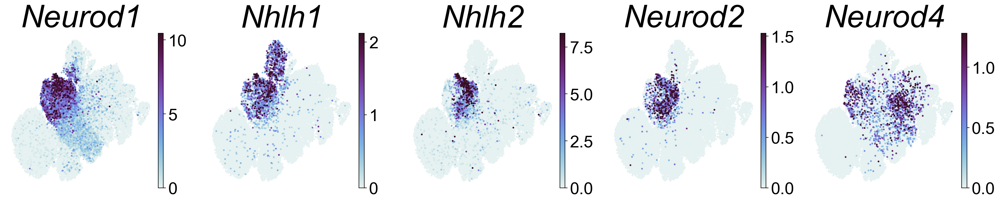

In [9]:
# Visualize neuronal genes

genes = ['Neurod1', 'Nhlh1','Nhlh2','Neurod2','Neurod4']
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/3327617283.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


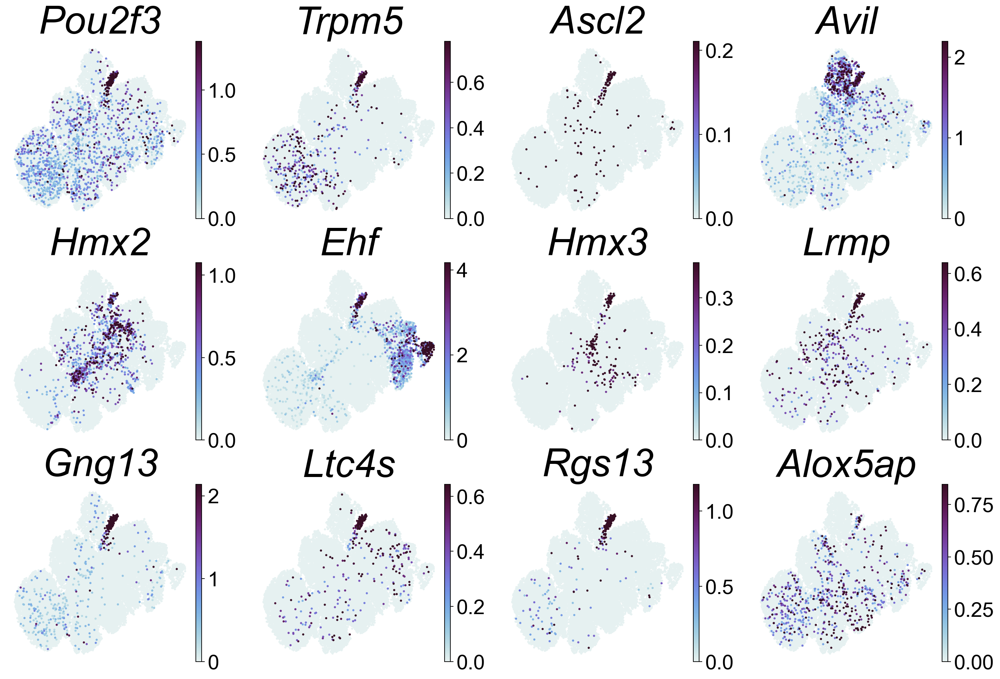

In [10]:
# Visualize tuft markers
genes = ['Pou2f3','Trpm5','Ascl2','Avil',
         'Hmx2','Ehf','Hmx3','Lrmp',
         'Gng13','Ltc4s','Rgs13','Alox5ap']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=4,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/735074513.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


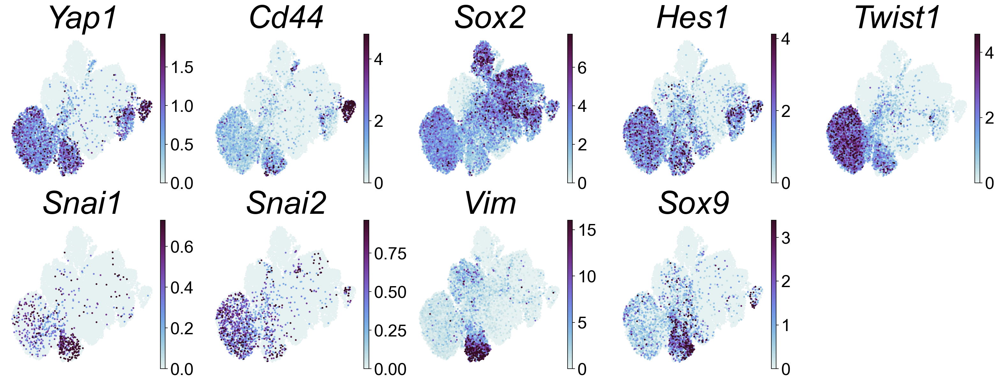

In [11]:
# Visualize Stem/Mesenchymal genes

genes = ['Yap1', 'Cd44','Sox2','Hes1','Twist1','Snai1','Snai2','Vim','Sox9'
         ]
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/1704514714.py:29: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


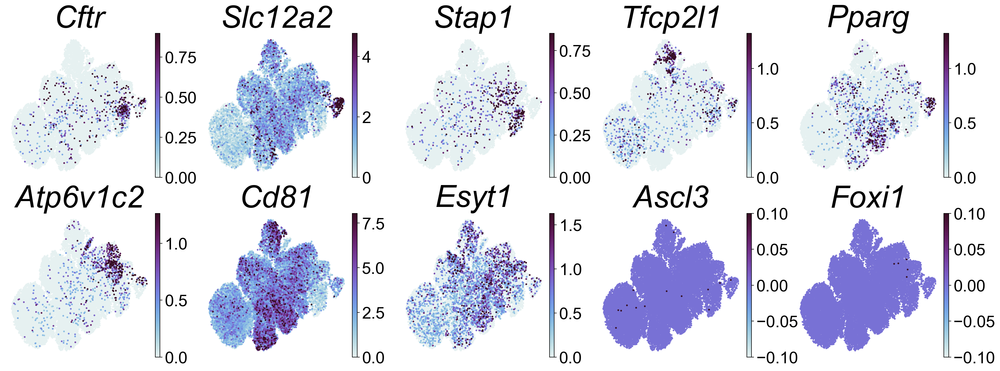

In [12]:
# Visualize ionocyte genes

genes = ['Cftr','Slc12a2', 'Stap1','Tfcp2l1','Pparg','Atp6v1c2',
        'Cd81','Esyt1', 'Ascl3','Foxi1']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/3551545086.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


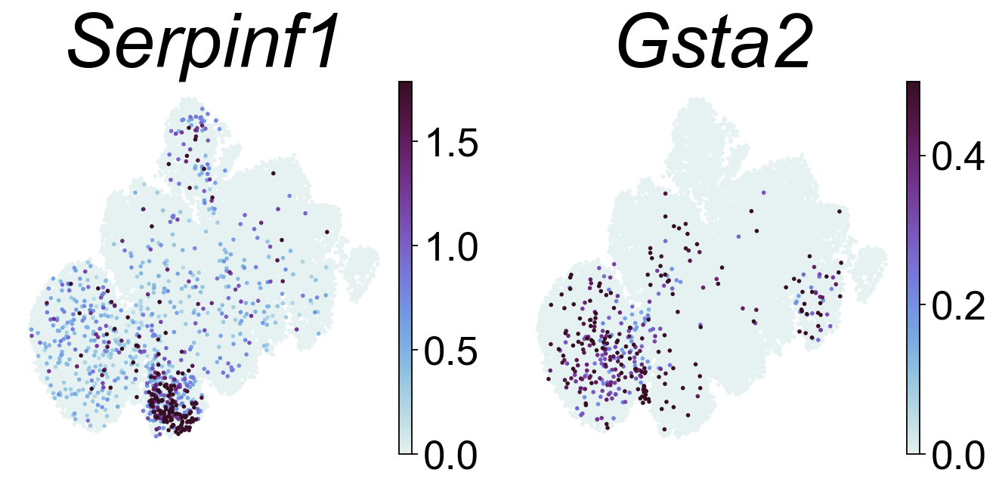

In [13]:
# Visualize TIP markers
genes = ['Serpinf1','Gsta2']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/4228783349.py:24: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


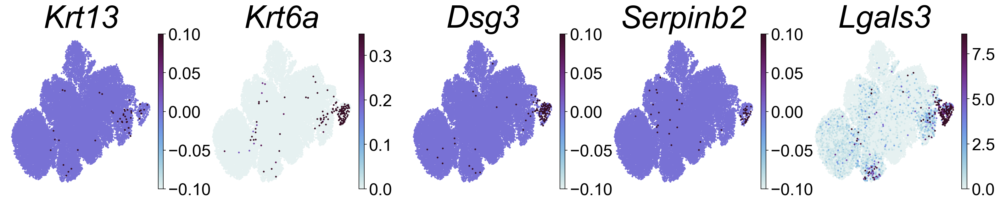

In [14]:
# Visualize hillock markers
genes = ['Krt13','Krt6a','Dsg3', 'Serpinb2','Lgals3']

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/3435588304.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


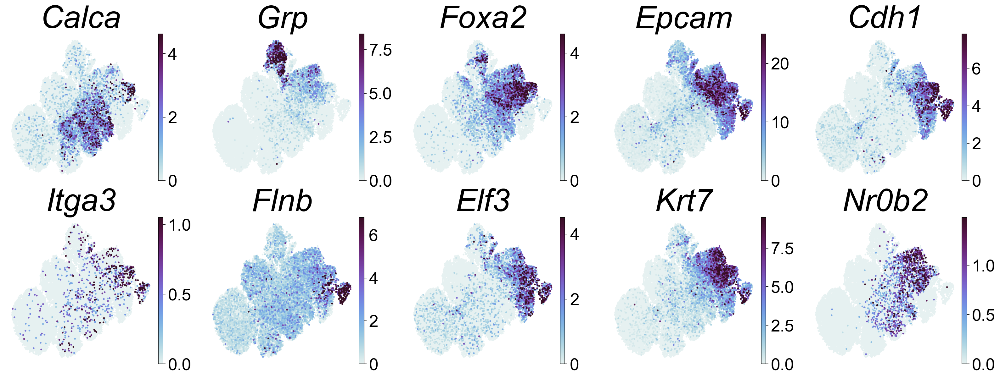

In [15]:
# Visualize A2 state markers
genes = ['Calca','Grp','Foxa2','Epcam','Cdh1','Itga3','Flnb','Elf3','Krt7','Nr0b2']
#['Elf3','Nr0b1','Tcf3','Foxa1','Foxa2','Smad4','Fli1','Gata4','Neurod2','Olig2']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/857935799.py:28: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


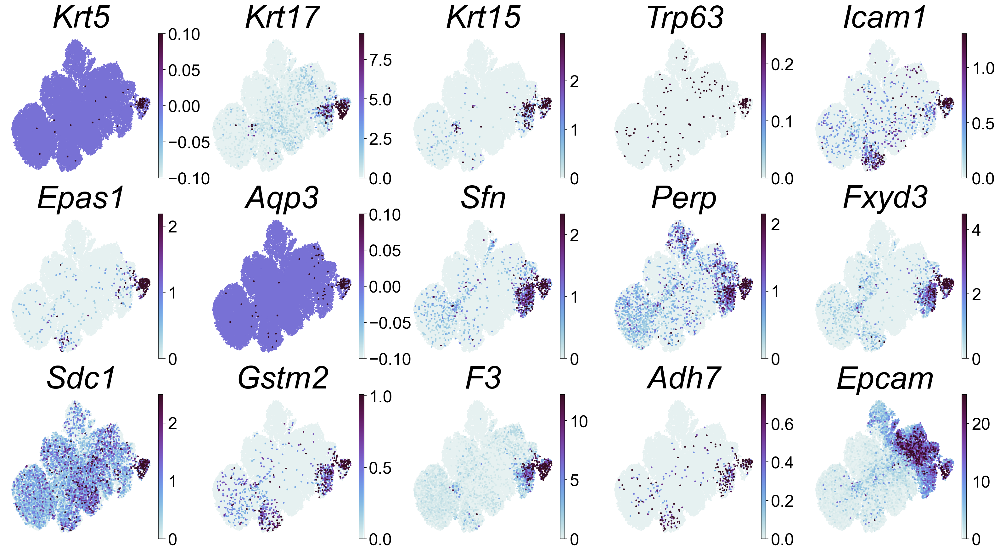

In [16]:
# Visualize basal genes
genes = ['Krt5', 'Krt17','Krt15','Trp63','Icam1','Epas1','Aqp3','Sfn','Perp','Fxyd3','Sdc1','Gstm2','F3',
         'Adh7','Epcam']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/739702094.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


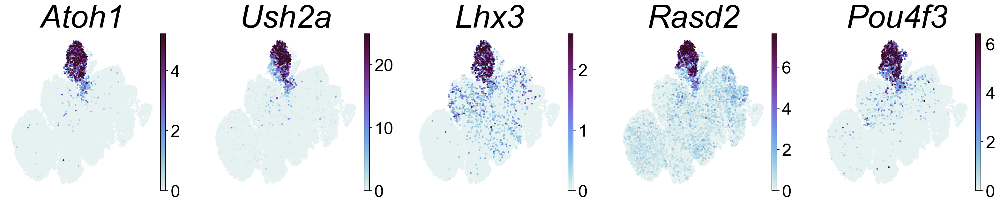

In [17]:
# Visualize Atoh1 genes
genes = ['Atoh1','Ush2a','Lhx3','Rasd2','Pou4f3']

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

### Visualize cell fate markers per cluster (for **Fig. 2g**)

{'mainplot_ax': <Axes: >,
 'group_extra_ax': <Axes: >,
 'size_legend_ax': <Axes: title={'center': 'Fraction of cells\nin group (%)'}>,
 'color_legend_ax': <Axes: title={'center': 'Mean expression\nin group'}>}

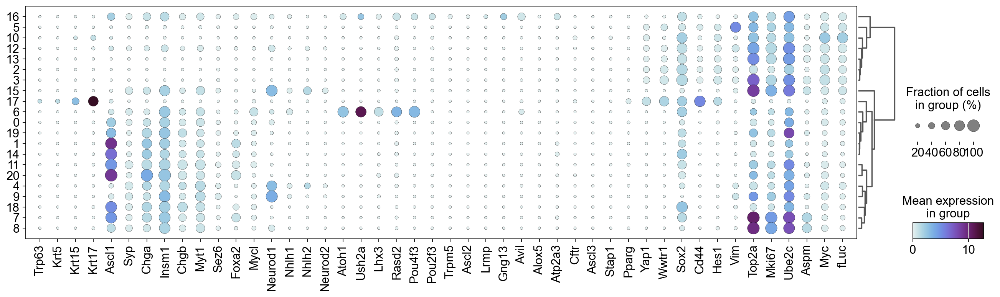

In [18]:
# Dot plot for Fig. 2g

more_types=["Trp63","Krt5","Krt15","Krt17",#basal
            "Ascl1", "Syp","Chga","Insm1","Chgb","Myt1","Sez6","Foxa2","Mycl", #NE
              "Neurod1","Nhlh1","Nhlh2","Neurod2", #neuronal
            'Atoh1','Ush2a','Lhx3','Rasd2','Pou4f3', # Atoh1/Inner Ear
            'Pou2f3','Trpm5','Ascl2','Lrmp','Gng13','Avil','Alox5','Atp2a3', #tuft
              "Cftr", "Ascl3", 'Stap1','Pparg', #ionocyte
              'Yap1','Wwtr1','Sox2','Cd44','Hes1',"Vim", # Stem-like/#Mesenchymal/Yap
             "Top2a","Mki67", "Ube2c","Aspm", #Proliferation
            'Myc',"fLuc"] #tumor markers

sc.set_figure_params(scanpy=True, fontsize=17) 
sc.pl.dotplot(
    adata2,figsize=[20,5],
    var_names=more_types,
    groupby='leiden_scVI_1.2',
    use_raw=False,
    layer="norm",show=False,
    color_map="cmo.dense", var_group_rotation=35,smallest_dot=10,dendrogram=True,
    save=False) 

### Visualize drug targets for **Fig. 5h**

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/3595397535.py:27: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


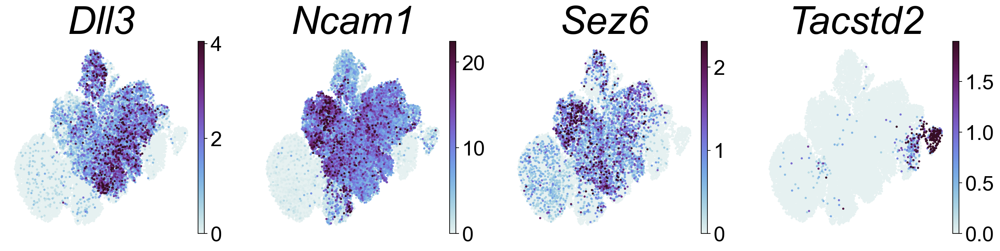

In [19]:
# Visualize drug targets
genes = ['Dll3','Ncam1','Sez6','Tacstd2',]

plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.umap(
    adata2,
    color=genes,
    use_raw=False,
    legend_loc="on data",
    color_map="cmo.dense",
    ncols=5,
    frameon=False,
    vmax="p99.5",
    layer="norm",
    s=25,
    show=False,
    return_fig=True
)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/3111629306.py:26: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("Spectral")


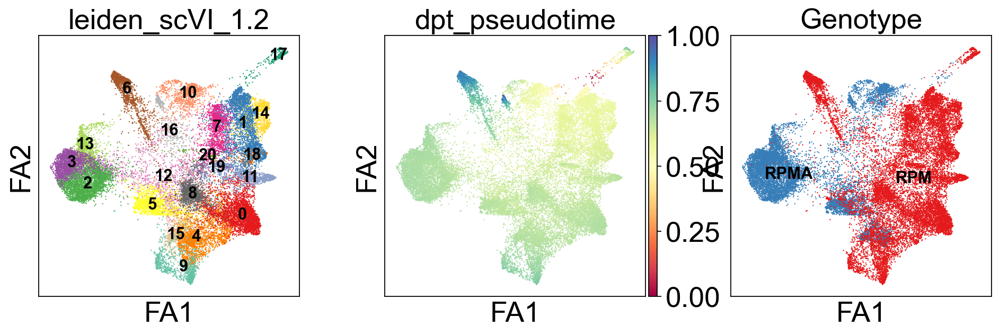

In [20]:
from matplotlib.colors import LinearSegmentedColormap
palette=[
  "#E41A1C", # strong red
  "#377EB8", # medium blue
  "#4DAF4A", # green
  "#984EA3", # purple
  "#FF7F00", # orange
  "#FFFF33", # yellow
  "#A65628", # brown
  "#e7298a", # pink
  "#666666", # grey
  "#66C2A5", # teal
  "#FC8D62", # salmon
  "#8DA0CB", # soft blue
  "#E78AC3", # soft pink (different from 8)
  "#A6D854", # light green (but yellowish tint, not green)
  "#FFD92F", # lemon yellow
  "#E5C494", # light brown
  "#B3B3B3", # light grey
  "#1B9E77", # deep teal
  "#D95F02", # dark orange
  "#7570B3", # strong purple
  "#66A61E"  # olive green (NOT same green as before)
]

cmap = plt.cm.get_cmap("Spectral")
sc.pl.draw_graph(adata2, color=['leiden_scVI_1.2', 'dpt_pseudotime','Genotype'], legend_loc='on data', color_map=cmap, palette=palette, legend_fontsize=14)

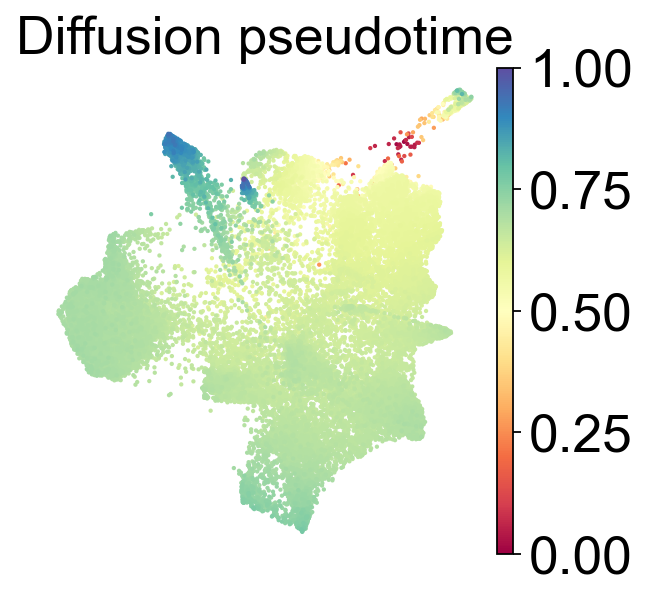

In [21]:
sc.pl.draw_graph(adata2, color=['dpt_pseudotime',], 
                 legend_loc='right margin', color_map=cmap,title='Diffusion pseudotime',
                 frameon=False,size=15  # optional: increase point size for better visibility
                )

### Visualize FA map by fate
**Fig. 3c**

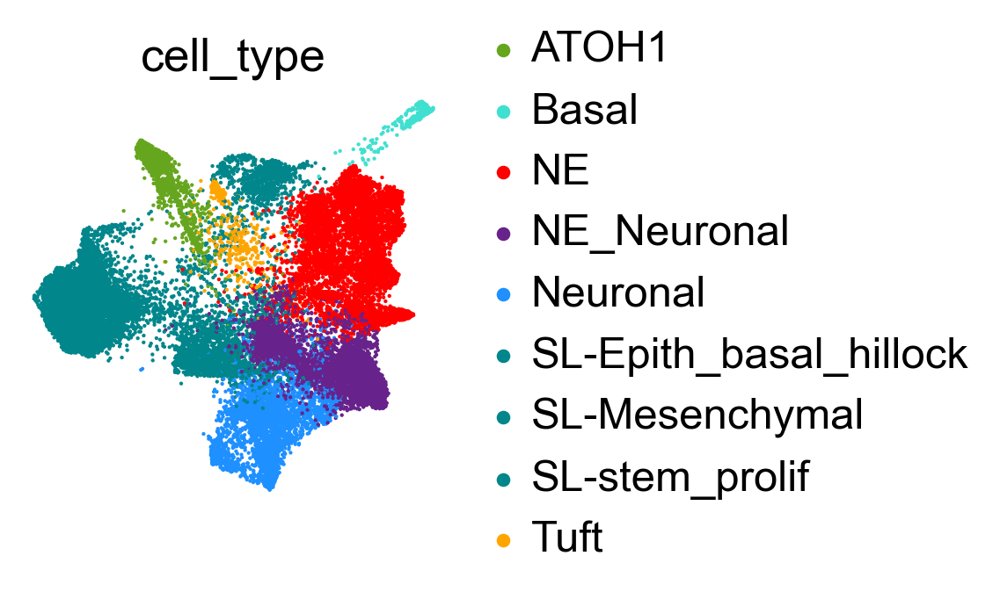

In [22]:
pheno_col = [
    "#66A61E",  # already hex
    "#40E0D0",  # turquoise
    "red",  # brown2
    "#68228B",  # darkorchid4
    "#1E90FF",  # dodgerblue
    "#00868B",  # turquoise4
    "#00868B",  # turquoise4
    "#00868B",  # turquoise4
    "#FFA500",  # orange
]

sc.pl.draw_graph(adata2, color=['cell_type'], legend_loc='right margin', color_map=cmap, 
                 palette=pheno_col, frameon=False, size=15)    

### Visualize key fate genes in FA space
**Extended Data Fig. 6d**

/var/folders/92/7ylp4dyx3yqgjqr8flnjz0hw0000gn/T/ipykernel_5333/482596841.py:12: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


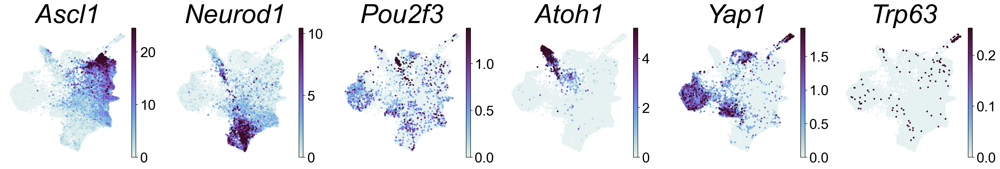

In [23]:
plt.rcParams['figure.figsize'] = [10, 8]
sc.set_figure_params(scanpy=True, fontsize=24)

# Plot without showing immediately
g = sc.pl.draw_graph(adata2, color=['Ascl1','Neurod1','Pou2f3','Atoh1','Yap1','Trp63'], legend_loc='right margin', color_map="cmo.dense", 
                  ncols=6, frameon=False, size=35, vmax='p99.5',  layer="norm",show=False,return_fig=True)

# Make gene names (titles) larger and italic
for ax in g.axes:
    ax.set_title(ax.get_title(), fontsize=45, fontstyle='italic')

plt.tight_layout()
plt.show()